In [1]:
import pandas as pd
from tqdm.notebook import tqdm
import warnings
import json
from mplsoccer.pitch import Pitch
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
warnings.filterwarnings('ignore')

**Para todos los elementos trackeable del partido**

In [21]:
with open('data/matches/2841/structured_data.json') as f:
        match_js = json.load(f)

match_js[300]['possession']

{'trackable_object': None, 'group': 'away team'}

In [16]:
event = 0
events = []
for i in tqdm(range(len(match_js))):
    for j in range(len(match_js[i]['data'])):
            try:
                if match_js[i]['data'][j]['trackable_object']:
                    event_id = event +1
                    try:
                        poss_to = match_js[i]['possesion']['trackable_object']
                    except:
                        poss_to = None
                    try:
                        poss_gr = match_js[i]['possesion']['group']
                    except:
                        poss_gr = None
                    pos_x = match_js[i]['data'][j]['x']
                    pos_y = match_js[i]['data'][j]['y']
                    time = match_js[i]['time']
                    period = match_js[i]['period']
                    track_object = match_js[i]['data'][j]['trackable_object']
                    track_id = match_js[i]['data'][j]['track_id']


                    ev = {'event_id': event_id,
                              'trackable_object_possession': poss_to,
                              'possession_group': poss_gr,
                              'pos_x': pos_x,
                              'pos_y':pos_y,
                              'time': time,
                              'period': period,
                              'track_object': track_object,
                              'track_id': track_id}
                    events.append(ev)
                else:
                    pass
            except:
                pass
    
match = pd.DataFrame(events)

  0%|          | 0/68400 [00:00<?, ?it/s]

In [17]:
match

,event_id,trackable_object_possession,possession_group,pos_x,pos_y,time,period,track_object,track_id
0,1,None,None,11.551222,-0.673778,0:01.40,1.0,1684,6
1,1,None,None,-4.336226,16.819009,0:01.40,1.0,956,16
2,1,None,None,-15.772598,-17.207769,0:01.40,1.0,11514,1
3,1,None,None,-2.436857,0.373551,0:01.40,1.0,5720,4
4,1,None,None,-17.616912,-5.395687,0:01.40,1.0,3862,10
...,...,...,...,...,...,...,...,...,...
775249,1,None,None,35.152473,9.870140,None,NaN,5720,9369
775250,1,None,None,41.218051,-15.323784,None,NaN,10271,9367
775251,1,None,None,45.893862,0.141743,None,NaN,6689,9362
775252,1,None,None,3.007291,0.534388,None,NaN,1684,9359


In [22]:
def generate_teams_match_data(file:str, file2:str)->(pd.DataFrame, pd.DataFrame):
    
    with open(file) as f:
        match_js = json.load(f)
    
    with open(file2) as f2:
        match_data_js = json.load(f2)
    
    event = 0
    events = []
    for i in tqdm(range(len(match_js))):
        for j in range(len(match_js[i]['data'])):
                try:
                    if match_js[i]['data'][j]['trackable_object']:
                        event_id = event +1
                        try:
                            poss_to = match_js[i]['possession']['trackable_object']
                        except:
                            poss_to = None
                        try:
                            poss_gr = match_js[i]['possession']['group']
                        except:
                            poss_gr = None
                        pos_x = match_js[i]['data'][j]['x']
                        pos_y = match_js[i]['data'][j]['y']
                        time = match_js[i]['time']
                        period = match_js[i]['period']
                        track_object = match_js[i]['data'][j]['trackable_object']
                        track_id = match_js[i]['data'][j]['track_id']


                        ev = {'event_id': event_id,
                              'trackable_object_possession': poss_to,
                              'possession_group': poss_gr,
                              'pos_x': pos_x,
                              'pos_y':pos_y,
                              'time': time,
                              'period': period,
                              'track_object': track_object,
                              'track_id': track_id}
                        events.append(ev)
                    else:
                        pass
                except:
                    pass
    
    match = pd.DataFrame(events)
    p1 = match[match.period == 1]
    p2 = match[match.period == 2]
    p2['pos_x_abs'] = [-1 * i for i in p2.pos_x]
    p2['pos_y_abs'] = [-1 * i for i in p2.pos_y]
    p1['pos_x_abs'] = [1 * i for i in p1.pos_x]
    p1['pos_y_abs'] = [1 * i for i in p1.pos_y]
    all_p = pd.concat([p1,p2],0)
    
    players = pd.DataFrame(match_data_js['players'])[['id','trackable_object','first_name','last_name','team_id']]
    pos = [match_data_js['players'][i]['player_role']['name'] for i in range(len(players))]
    id_pos = [match_data_js['players'][i]['player_role']['id'] for i in range(len(players))]
    home_away = ['Home' if match_data_js['home_team']['id'] == players['team_id'][i] else 'Away' for i in range(len(players))]
    players['Position'] = pos
    players['id_pos'] = id_pos
    players['Home_Away'] = home_away
    
    final = all_p.merge(players, how='left', left_on='track_object', right_on='trackable_object' )
    
    final_home = final[final.Home_Away=='Home'].reset_index(drop=True)
    final_home.reset_index(drop=True, inplace=True)
    final_away = final[final.Home_Away=='Away']
    final_away.reset_index(drop=True, inplace=True)
    
    return final_home, final_away
    

In [23]:
f_h, f_a = generate_teams_match_data('data/matches/2841/structured_data.json','data/matches/2841/match_data.json' )

  0%|          | 0/68400 [00:00<?, ?it/s]

In [24]:
f_h.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354481 entries, 0 to 354480
Data columns (total 19 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   event_id                     354481 non-null  int64  
 1   trackable_object_possession  125341 non-null  float64
 2   possession_group             306149 non-null  object 
 3   pos_x                        354481 non-null  float64
 4   pos_y                        354481 non-null  float64
 5   time                         354481 non-null  object 
 6   period                       354481 non-null  float64
 7   track_object                 354481 non-null  int64  
 8   track_id                     354481 non-null  int64  
 9   pos_x_abs                    354481 non-null  float64
 10  pos_y_abs                    354481 non-null  float64
 11  id                           354481 non-null  float64
 12  trackable_object             354481 non-null  float64
 13 

In [33]:
f_h.trackable_object_possession.value_counts()

4560.0     11026
11712.0    10589
3862.0      9214
6689.0      8409
10530.0     8358
12524.0     7808
5336.0      6758
11311.0     6683
3747.0      6448
2199.0      6279
1684.0      5708
9745.0      4673
4497.0      4368
11514.0     3805
5720.0      3602
6260.0      3591
9775.0      3525
12395.0     3365
8886.0      2831
956.0       2340
6472.0      1796
6460.0      1656
10271.0      965
24800.0      688
1101.0       664
24861.0      192
Name: trackable_object_possession, dtype: int64

In [5]:
f_h.groupby(['first_name','last_name']).agg(['count','max'])

event_id      pos_x             pos_y              time  \
                         count max  count        max  count        max  count   
first_name last_name                                                            
Ansu       Fati           5109   1   5109  33.743796   5109   8.986005   5109   
Antoine    Griezmann     31569   1  31569  50.752845  31569  34.912290  31569   
Arturo     Vidal         15231   1  15231  51.892872  15231  33.779231  15231   
Clément    Lenglet       30866   1  30866  51.852960  30866  35.219781  30866   
Frenkie    de Jong       39020   1  39020  51.519383  39020  34.039324  39020   
Gerard     Pique         31413   1  31413  53.193917  31413  33.659949  31413   
Ivan       Rakitic       36583   1  36583  46.590578  36583  32.537276  36583   
Jordi      Alba          35131   1  35131  52.491770  35131  34.720784  35131   
Lionel     Messi         29806   1  29806  53.733566  29806  34.409924  29806   
Luis       Suarez        27593   1  27593  54.718548  27593  34.800896  27593   
Marc-Andre ter Stegen    12198   1  12198  53.839613  12198  13.642483  12198   
Nelson     Semedo        21050   1  21050  54.512485  21050  32.214220  21050   
Sergi      Roberto       38912   1  38912  54.687329  38912  34.998222  38912   

                                period       ... trackable_object           \
                            max  count  max  ...            count      max   
first_name last_name                         ...                             
Ansu       Fati        94:43.10   5109  2.0  ...             5109  24800.0   
Antoine    Griezmann    9:52.40  31569  2.0  ...            31569    956.0   
Arturo     Vidal       94:54.30  15231  2.0  ...            15231   1101.0   
Clément    Lenglet      9:56.70  30866  2.0  ...            30866  11712.0   
Frenkie    de Jong      9:56.70  39020  2.0  ...            39020  12524.0   
Gerard     Pique        9:56.70  31413  2.0  ...            31413   3862.0   
Ivan       Rakitic      9:56.70  36583  2.0  ...            36583   4560.0   
Jordi      Alba         9:56.70  35131  2.0  ...            35131   5336.0   
Lionel     Messi        9:28.00  29806  2.0  ...            29806   6260.0   
Luis       Suarez       9:30.40  27593  2.0  ...            27593   6460.0   
Marc-Andre ter Stegen   9:56.70  12198  2.0  ...            12198   6689.0   
Nelson     Semedo       9:56.70  21050  2.0  ...            21050  11514.0   
Sergi      Roberto      9:56.70  38912  2.0  ...            38912   9745.0   

                      team_id        Position                    id_pos        \
                        count    max    count                max  count   max   
first_name last_name                                                            
Ansu       Fati          5109  264.0     5109        Left Winger   5109  12.0   
Antoine    Griezmann    31569  264.0    31569        Left Winger  31569  12.0   
Arturo     Vidal        15231  264.0    15231    Right Wing Back  15231   6.0   
Clément    Lenglet      30866  264.0    30866   Left Center Back  30866   3.0   
Frenkie    de Jong      39020  264.0    39020      Left Midfield  39020   9.0   
Gerard     Pique        31413  264.0    31413  Right Center Back  31413   4.0   
Ivan       Rakitic      36583  264.0    36583    Center Midfield  36583   8.0   
Jordi      Alba         35131  264.0    35131     Left Wing Back  35131   5.0   
Lionel     Messi        29806  264.0    29806       Right Winger  29806  13.0   
Luis       Suarez       27593  264.0    27593     Center Forward  27593  15.0   
Marc-Andre ter Stegen   12198  264.0    12198         Goalkeeper  12198   0.0   
Nelson     Semedo       21050  264.0    21050    Right Wing Back  21050   6.0   
Sergi      Roberto      38912  264.0    38912     Right Midfield  38912  10.0   

                      Home_Away        
                          count   max  
first_name last_name                   
Ansu       Fati            5109  Home  
Antoine    Griezman

In [6]:
f_a.groupby(['first_name','last_name']).agg(['count','max'])

event_id      pos_x             pos_y              time  \
                        count max  count        max  count        max  count   
first_name last_name                                                           
           Casemiro     32738   1  32738  51.111666  32738  28.242544  32738   
           Isco         30888   1  30888  52.686671  30888  34.530744  30888   
           Rodrygo       6277   1   6277  48.940890   6277  36.595913   6277   
Daniel     Carvajal     34468   1  34468  51.890562  34468  36.320379  34468   
Federico   Valverde     31321   1  31321  48.523894  31321  33.803417  31321   
Ferland    Mendy        33556   1  33556  55.000541  33556  37.135148  33556   
Gareth     Bale         35872   1  35872  52.465846  35872  36.893905  35872   
Karim      Benzema      33914   1  33914  55.056179  33914  32.913549  33914   
Luka       Modric        6553   1   6553  40.600195   6553  27.168283   6553   
Raphael    Varane       26224   1  26224  52.452084  26224  32.075978  26224   
Sergio     Ramos        28212   1  28212  52.578736  28212  34.112305  28212   
Thibaut    Courtois      6154   1   6154  53.473607   6154  33.481810   6154   
Toni       Kroos        37997   1  37997  53.887291  37997  37.182473  37997   

                               period       ... trackable_object           \
                           max  count  max  ...            count      max   
first_name last_name                        ...                             
           Casemiro    9:34.80  32738  2.0  ...            32738   1684.0   
           Isco        9:56.70  30888  2.0  ...            30888   4497.0   
           Rodrygo    94:54.30   6277  2.0  ...             6277  24861.0   
Daniel     Carvajal    9:51.90  34468  2.0  ...            34468   2199.0   
Federico   Valverde    9:56.70  31321  2.0  ...            31321  12395.0   
Ferland    Mendy       9:55.40  33556  2.0  ...            33556  11311.0   
Gareth     Bale        9:56.70  35872  2.0  ...            35872   3747.0   
Karim      Benzema     9:56.70  33914  2.0  ...            33914   5720.0   
Luka       Modric     94:54.30   6553  2.0  ...             6553   6472.0   
Raphael    Varane      9:34.90  26224  2.0  ...            26224   8886.0   
Sergio     Ramos       9:29.40  28212  2.0  ...            28212   9775.0   
Thibaut    Courtois    9:19.70   6154  2.0  ...             6154  10271.0   
Toni       Kroos       9:52.70  37997  2.0  ...            37997  10530.0   

                     team_id        Position                    id_pos        \
                       count    max    count                max  count   max   
first_name last_name                                                           
           Casemiro    32738  262.0    32738    Center Midfield  32738   8.0   
           Isco        30888  262.0    30888        Left Winger  30888  12.0   
           Rodrygo      6277  262.0     6277        Left Winger   6277  12.0   
Daniel     Carvajal    34468  262.0    34468    Right Wing Back  34468   6.0   
Federico   Valverde    31321  262.0    31321     Right Midfield  31321  10.0   
Ferland    Mendy       33556  262.0    33556     Left Wing Back  33556   5.0   
Gareth     Bale        35872  262.0    35872       Right Winger  35872  13.0   
Karim      Benzema     33914  262.0    33914     Center Forward  33914  15.0   
Luka       Modric       6553  262.0     6553     Right Midfield   6553  10.0   
Raphael    Varane      26224  262.0    26224  Right Center Back  26224   4.0   
Sergio     Ramos       28212  262.0    28212   Left Center Back  28212   3.0   
Thibaut    Courtois     6154  262.0     6154         Goalkeeper   6154   0.0   
Toni       Kroos       37997  262.0    37997      Left Midfield  37997   9.0   

                     Home_Away        
                         count   max  
first_name last_name                  
           Casemiro      32738  Away  
           Isco          30888  Away  
           Rodrygo        6277 

<AxesSubplot:xlabel='pos_x_abs', ylabel='Count'>

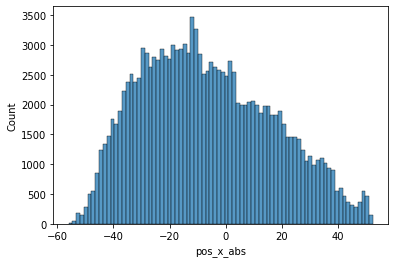

In [32]:
sns.histplot(f_a[f_a.possession_group=='away team'].pos_x_abs)

In [29]:
def plot_team_hist(df:pd.DataFrame)->None:
    
    '''
        This function reveices a dataframe and returns an histplot from the x values of all the players
        
        Parameters:
            df: Pandas dataframe with the team data
            
        Returns:
        
            Histogram of th value pos_x_abs
    
    '''
    
    plt.figure(figsize=(12,6))
    sns.histplot(df.pos_x_abs)
    plt.title(f'{df.Home_Away[0]} X Position')
    plt.ylabel(None)
    plt.xlabel(None)
    plt.show();

KeyError: 0

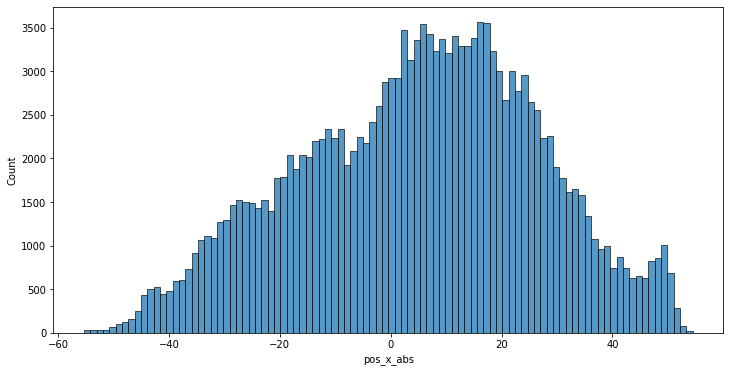

In [30]:
plot_team_hist(f_a[f_a.possession_group=='home team'])

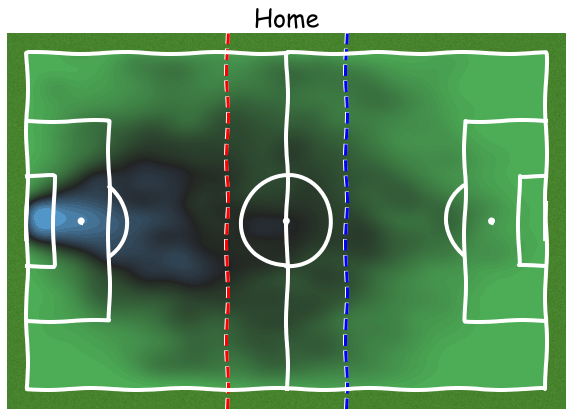

In [12]:
with plt.xkcd():
    pitch = Pitch(pitch_type='skillcorner', pitch_length= 105, pitch_width=68, pitch_color='grass', 
              line_color='white', stripe=True, line_zorder=3)
    fig, ax = pitch.draw(figsize=(12,6))
    ax.annotate('Home', (60,10), fontsize=25, ha='center', zorder=3)
    plt.axvline(-12,
            c='r',
            linewidth=3.,
            linestyle='--',
            label='Defending Line Limit')
    plt.axvline(12,
            c='b',
            linewidth=3.,
            linestyle='--',
            label='Defending Line Limit')
    cmap = sns.diverging_palette(130, 240, l=65, center='dark', as_cmap=True)
    kde = pitch.kdeplot(f_h.pos_x_abs, f_h.pos_y_abs, fill=True, ax=ax,
                   levels=100, shade_lowest=True, cut=4, cmap=cmap, zorder=1)
    plt.annotate('Home', (60,10), fontsize=25, ha='center', zorder=3)
    plt.title('Home', fontsize=25)
    plt.show();

''

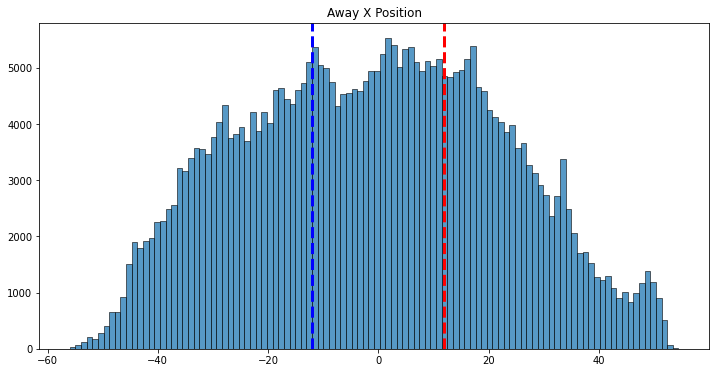

In [23]:
plt.figure(figsize=(12,6))
sns.histplot(f_a.pos_x_abs)
plt.axvline(12,
            c='r',
            linewidth=3.,
            linestyle='--',
            label='Defending Line Limit')
plt.axvline(-12,
            c='b',
            linewidth=3.,
            linestyle='--',
            label='Defending Line Limit')
plt.title('Away X Position')
plt.ylabel(None)
plt.xlabel(None)
;

In [ ]:
with plt.xkcd():
    pitch = Pitch(pitch_type='skillcorner', pitch_length= 105, pitch_width=68, pitch_color='grass', 
              line_color='white', stripe=True, line_zorder=3)
    fig, ax = pitch.draw(figsize=(12,6))
    ax.annotate('Away', (60,10), fontsize=25, ha='center', zorder=3)
    plt.axvline(12,
            c='r',
            linewidth=3.,
            linestyle='--',
            label='Defending Line Limit')
    plt.axvline(-12,
            c='b',
            linewidth=3.,
            linestyle='--',
            label='Defending Line Limit')
    cmap = sns.diverging_palette(130, 240, l=65, center='dark', as_cmap=True)
    kde = pitch.kdeplot(f_a.pos_x_abs, f_a.pos_y_abs, fill=True, ax=ax,
                   levels=100, shade_lowest=True, cut=4, cmap=cmap, zorder=1)
    plt.annotate('Away', (60,10), fontsize=25, ha='center', zorder=3)
    plt.title('Away', fontsize=25)
    plt.show();

**Para un elemento en concreto**

In [8]:
def generate_player_match_data(file:str, file2:str, id_player:str)->pd.DataFrame:    
    
    with open(file) as f:
            match_js = json.load(f)

    with open(file2) as f2:
            match_data_js = json.load(f2)

    event = 0
    events = []
    for i in tqdm(range(len(match_js))):
        for j in range(len(match_js[i]['data'])):
            try:
                if match_js[i]['data'][j]['trackable_object'] == id_player:
                    event_id = event +1
                    pos_x = match_js[i]['data'][j]['x']
                    pos_y = match_js[i]['data'][j]['y']
                    time = match_js[i]['time']
                    period = match_js[i]['period']
                    track_object = id_player
                    track_id = match_js[i]['data'][j]['track_id']


                    ev = {'event_id': event_id,
                          'pos_x': pos_x,
                          'pos_y':pos_y,
                          'time': time,
                          'period': period,
                          'track_object': track_object,
                          'track_id': track_id}
                    events.append(ev)
                else:
                    pass
            except:
                pass

    match = pd.DataFrame(events)
    p1 = match[match.period == 1]
    p2 = match[match.period == 2]
    p2['pos_x_abs'] = [-1 * i for i in p2.pos_x]
    p2['pos_y_abs'] = [-1 * i for i in p2.pos_y]
    p1['pos_x_abs'] = [1 * i for i in p1.pos_x]
    p1['pos_y_abs'] = [1 * i for i in p1.pos_y]
    all_p = pd.concat([p1,p2],0)

    players = pd.DataFrame(match_data_js['players'])[['id','trackable_object','first_name','last_name','team_id']]
    pos = [match_data_js['players'][i]['player_role']['name'] for i in range(len(players))]
    id_pos = [match_data_js['players'][i]['player_role']['id'] for i in range(len(players))]
    home_away = ['Home' if match_data_js['home_team']['id'] == players['team_id'][i] else 'Away' for i in range(len(players))]
    players['Position'] = pos
    players['id_pos'] = id_pos
    players['Home_Away'] = home_away

    final = all_p.merge(players, how='left', left_on='track_object', right_on='trackable_object' )
    
    return final

In [9]:
sr = generate_player_match_data('data/matches/2841/structured_data.json','data/matches/2841/match_data.json', 9775)

  0%|          | 0/68400 [00:00<?, ?it/s]

In [10]:
sr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 28212 entries, 0 to 28211
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   event_id          28212 non-null  int64  
 1   pos_x             28212 non-null  float64
 2   pos_y             28212 non-null  float64
 3   time              28212 non-null  object 
 4   period            28212 non-null  float64
 5   track_object      28212 non-null  int64  
 6   track_id          28212 non-null  int64  
 7   pos_x_abs         28212 non-null  float64
 8   pos_y_abs         28212 non-null  float64
 9   id                28212 non-null  int64  
 10  trackable_object  28212 non-null  int64  
 11  first_name        28212 non-null  object 
 12  last_name         28212 non-null  object 
 13  team_id           28212 non-null  int64  
 14  Position          28212 non-null  object 
 15  id_pos            28212 non-null  int64  
 16  Home_Away         28212 non-null  object

In [12]:
sr.track_id.value_counts().sort_values(ascending=False)

5637    838
3044    737
9055    627
2763    621
299     614
       ... 
4601      5
7465      4
5393      3
2303      1
7723      1
Name: track_id, Length: 240, dtype: int64

In [16]:
import math

In [ ]:
math.sqrt((x2-x1)**2+(y2-y1)**2)

In [21]:
sr.pos_x_abs[1]

20.6761425563

In [34]:
sum_x = 0
for i in range(len(sr[sr.track_id == 5637])-1):
    
    sum_x += abs(math.sqrt((sr.pos_x_abs[i+1]-sr.pos_x_abs[i])**2 +
                       (sr.pos_y_abs[i+1]-sr.pos_y_abs[i])**2))
    #print(sum_x)

In [35]:
sum_x

330.94564095418184

In [36]:
sr[sr.track_id == 5637]['time'].min()

'56:42.30'

In [37]:
sr[sr.track_id == 5637]['time'].max()

'58:06.00'

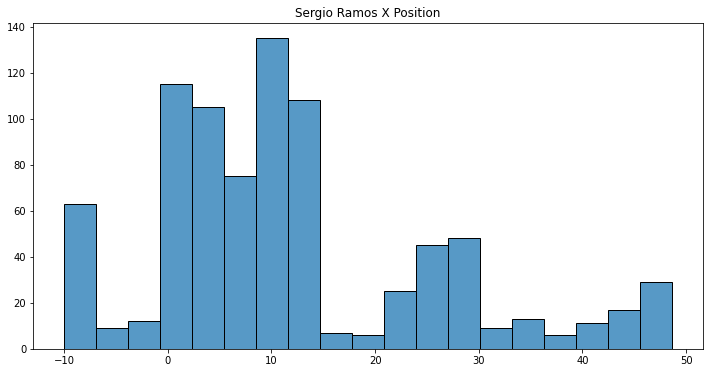

In [14]:
plt.figure(figsize=(12,6))
sns.histplot(sr[sr.track_id == 5637].pos_x_abs)
plt.title('Sergio Ramos X Position')
plt.ylabel(None)
plt.xlabel(None);

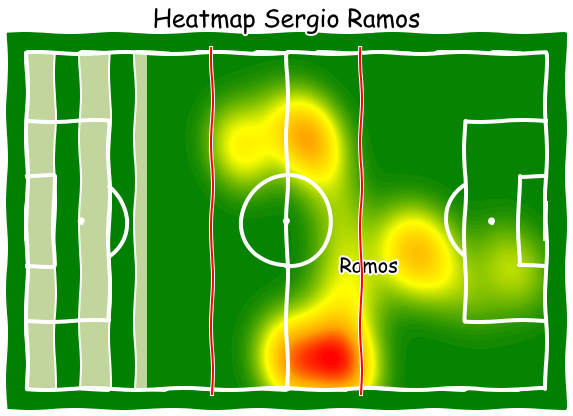

In [15]:
with plt.xkcd():
    pitch = Pitch(pitch_type='skillcorner', pitch_length= 105, pitch_width=68, pitch_color='green', 
              line_color='white', stripe=True, line_zorder=3)
    fig, ax = pitch.draw(figsize=(12,6))
    plt.annotate('Heatmap Sergio Ramos', (60,10), fontsize=25, ha='center', zorder=3)
    custcmap = matplotlib.colors.LinearSegmentedColormap.from_list('custom', ['green','yellow','orange','red'])
    kde = pitch.kdeplot(sr[sr.track_id == 5637].pos_x_abs, sr[sr.track_id == 5637].pos_y_abs, fill=True, ax=ax,
                   levels=100, shade_lowest=True, cut=4, cmap=custcmap, zorder=1)
    plt.annotate(f'{sr.last_name.unique()[0]}',(sr[sr.track_id == 5637].pos_x_abs.median(),sr[sr.track_id == 5637].pos_y_abs.median()), fontsize=20)
    plt.plot([-15,-15],[-35,35] ,color='r', zorder=3)
    plt.plot([15,15],[-35,35] ,color='r', zorder=3)
    plt.title('Heatmap Sergio Ramos', fontsize=25)
    plt.show();

In [15]:
def plot_heatmap_pos(data, data_match, id_player=None):
    event = 0
    events = []
    for i in range(len(data)):
        for j in range(len(data[i]['data'])):
            try:
                if data[i]['data'][j]['trackable_object'] == id_player:
                    event_id = event + 1
                    pos_x = data[i]['data'][j]['x']
                    pos_y = data[i]['data'][j]['y']
                    time = data[i]['time']
                    period = data[i]['period']
                    track_object = id_player
                    
                    

                    ev = {'event_id': event_id,
                          'pos_x': pos_x,
                          'pos_y':pos_y,
                          'time': time,
                          'period': period,
                          'track_object': track_object}
                    events.append(ev)
                    event += 1
                else:
                    pass
            except:
                pass
            
    df = pd.DataFrame(events)
    try:
        p1 = df[df.period == 1]
        p2 = df[df.period == 2]
        p2['pos_x_abs'] = [-1 * i for i in p2.pos_x]
        p2['pos_y_abs'] = [-1 * i for i in p2.pos_y]
    
        all_p = pd.concat([p1,p2],0)
    
        pos_median_x = all_p.pos_x_abs.median()
        pos_median_y = all_p.pos_y_abs.median()
        
        home_away = data_match[data_match.trackable_object == id_player]['Home_Away'].values[0]
    
        if home_away == 'Away':
            if 12 < pos_median_x:
                pl_clas = 'Defending Line'
            elif -12 < pos_median_x < 12:
                pl_clas = 'Midfield Line'
            else:
                pl_clas = 'Attacking Line'
        else:
            if 12 < pos_median_x:
                pl_clas = 'Attacking Line'
            elif -12 < pos_median_x < 12:
                pl_clas = 'Midfield Line'
            else:
                pl_clas = 'Defending Line'

        name = data_match[data_match.trackable_object == id_player]['first_name'].values[0] + ' ' + data_match[data_match.trackable_object == id_player]['last_name'].values[0]

        with plt.xkcd():
            pitch = Pitch(pitch_type='skillcorner', pitch_length= 105, pitch_width=68, pitch_color='grass', 
                  line_color='white', stripe=True, line_zorder=3)
            fig, ax = pitch.draw(figsize=(12,6))
            cmap = sns.diverging_palette(130, 240, l=65, center='dark', as_cmap=True)
            kde = pitch.kdeplot(all_p.pos_x_abs, all_p.pos_y_abs, fill=True, ax=ax,
                       levels=100, shade_lowest=True, cut=4, cmap=cmap, zorder=1)
            plt.annotate('+',(pos_median_x,pos_median_y), fontsize=20)
            plt.title(f'Heatmap {name} - {pl_clas}', fontsize=25)
            plt.show();
    
    except:
        try:
            p2 = df[df.period == 2]
            p2['pos_x_abs'] = [-1 * i for i in p2.pos_x]
            p2['pos_y_abs'] = [-1 * i for i in p2.pos_y]
        
            all_p = p2
    
            pos_median_x = all_p.pos_x_abs.median()
            pos_median_y = all_p.pos_y_abs.median()
            
            home_away = data_match[data_match.trackable_object == id_player]['Home_Away'].values[0]
    
            if home_away == 'Away':
                if 12 < pos_median_x:
                    pl_clas = 'Defending Line'
                elif -12 < pos_median_x < 12:
                    pl_clas = 'Midfield Line'
                else:
                    pl_clas = 'Attacking Line'
            else:
                if 12 < pos_median_x:
                    pl_clas = 'Attacking Line'
                elif -12 < pos_median_x < 12:
                    pl_clas = 'Midfield Line'
                else:
                    pl_clas = 'Defending Line'

            name = data_match[data_match.trackable_object == id_player]['first_name'].values[0] + ' ' + data_match[data_match.trackable_object == id_player]['last_name'].values[0]

            with plt.xkcd():
                pitch = Pitch(pitch_type='skillcorner', pitch_length= 105, pitch_width=68, pitch_color='grass', 
                      line_color='white', stripe=True, line_zorder=3)
                fig, ax = pitch.draw(figsize=(12,6))
                cmap = sns.diverging_palette(130, 240, l=65, center='dark', as_cmap=True)
                kde = pitch.kdeplot(all_p.pos_x_abs, all_p.pos_y_abs, fill=True, ax=ax,
                           levels=100, shade_lowest=True, cut=4, cmap=cmap, zorder=1)
                plt.annotate('+',(pos_median_x,pos_median_y), fontsize=20)
                plt.title(f'Heatmap {name} - {pl_clas}', fontsize=25)
                plt.show();
            
        except:
            name = data_match[data_match.trackable_object == id_player]['first_name'].values[0] + ' ' + data_match[data_match.trackable_object == id_player]['last_name'].values[0]
            print(f'No hay datos de {name}')

In [29]:
def plot_heatmap_team(df:pd.DataFrame, players:str)->None:
    
    print('Calculando posición de los jugadores en el terreno de juego ...\n')
    
    start_p = [n for n in df[df.period == 2].sort_values('id_pos').trackable_object.unique() if n in df[df.period == 1].trackable_object.unique()]
    subs = [n for n in df[df.period == 2].sort_values('id_pos').trackable_object.unique() if n not in df[df.period == 1].trackable_object.unique()]
    
    with plt.xkcd():
        matplotlib.rcParams['font.family'] = ['CENTAUR']
        pitch = Pitch(pitch_type='skillcorner', pitch_length= 105, pitch_width=68, pitch_color='limegreen', 
                  line_color='white', stripe=True, line_zorder=3)
        
        fig, ax = pitch.draw(figsize=(12,6))

        custcmap = matplotlib.colors.LinearSegmentedColormap.from_list('custom', ['limegreen','green','yellow','gold','orange','orangered','red'])
        kde = pitch.kdeplot(df.pos_x_abs, df.pos_y_abs, fill=True, ax=ax,
                       levels=100,shade=True, shade_lowest=True, cut=4, cmap=custcmap, zorder=1)
        
        print('Creando Mapa de calor ...\n')
        
        if players == 'start':
            def_line = 0
            mid_line = 0
            atk_line = 0
            for p in tqdm(start_p):
                
                name = df[df.trackable_object == p]['last_name'].values[0]
                x = round(df[df.trackable_object == p].pos_x_abs.median(),2)
                y = round(df[df.trackable_object == p].pos_y_abs.median(),2)
                
                if df.Home_Away.unique()[0] == 'Away':
                    
                    if 12 < x:
                        pl_clas = 'Defending Line'
                        def_line += 1
                    elif -12 < x < 12:
                        pl_clas = 'Midfield Line'
                        mid_line += 1
                    else:
                        pl_clas = 'Attacking Line'
                        atk_line += 1
                else:
                    
                    if 12 < x:
                        pl_clas = 'Attacking Line'
                        atk_line += 1
                    elif -12 < x < 12:
                        pl_clas = 'Midfield Line'
                        mid_line += 1
                    else:
                        pl_clas = 'Defending Line'
                        def_line += 1
                        
                print(f'{name} : {pl_clas} --> ({x},{y})')
                plt.annotate(f'+ {name}',(x,y), fontsize=20, zorder=4)
            #plt.annotate(f'Initial Squad - Tactic 1-{def_line-1}-{mid_line}-{atk_line}', (-25,35), color='black', fontsize= 20, zorder=4)
            plt.plot([-12,-12],[-35,35] ,color='r', zorder=3)
            plt.plot([12,12],[-35,35] ,color='r', zorder=3)
            plt.title(f'{df.Home_Away.unique()[0]} Team Initial Squad - Tactic 1-{def_line-1}-{mid_line}-{atk_line}', fontsize=25)
        
            print('\nGuardando imagen ...\n')
            plt.savefig(f'images/{df.Home_Away.unique()[0]}_Team.png')
        
        else:
            
            for p in tqdm(subs):
                name = df[df.trackable_object == p]['last_name'].values[0]
                x = round(df[df.trackable_object == p].pos_x_abs.median(),2)
                y = round(df[df.trackable_object == p].pos_y_abs.median(),2)
                
                if df.Home_Away.unique()[0] == 'Away':
                    
                    if 12 < x:
                        pl_clas = 'Defending Line'
                    elif -12 < x < 12:
                        pl_clas = 'Midfield Line'
                    else:
                        pl_clas = 'Attacking Line'
                        
                else:
                    
                    if 12 < x:
                        pl_clas = 'Attacking Line'
                    elif -12 < x < 12:
                        pl_clas = 'Midfield Line'
                    else:
                        pl_clas = 'Defending Line'
                        
                print(f'{name} : {pl_clas} --> (x:{x}, y:{y})')
                plt.annotate(f'+ {name}',(x,y), fontsize=20, zorder=4)
            #plt.annotate('Subtitutions', (-15,35), fontsize= 20)
            
            plt.plot([-12,-12],[-35,35] ,color='r', zorder=3)
            plt.plot([12,12],[-35,35] ,color='r', zorder=3)
            plt.title(f'{df.Home_Away.unique()[0]} Team Subtitutions', fontsize=25)
        
            print('\nGuardando imagen ...\n')
            plt.savefig(f'images/{df.Home_Away.unique()[0]}_Team_Subtitutions.png')
        plt.show();
    

Calculando posición de los jugadores en el terreno de juego ...

Creando Mapa de calor ...



  0%|          | 0/11 [00:00<?, ?it/s]

ter Stegen : Defending Line --> (-50.17,0.38)
Lenglet : Defending Line --> (-26.92,7.59)
Pique : Defending Line --> (-25.93,-6.73)
Alba : Defending Line --> (-16.15,21.08)
Semedo : Defending Line --> (-16.83,-21.27)
Rakitic : Defending Line --> (-16.7,-0.71)
de Jong : Midfield Line --> (-11.12,6.44)
Roberto : Midfield Line --> (-10.3,-13.08)
Griezmann : Midfield Line --> (2.93,10.59)
Messi : Midfield Line --> (5.55,-10.24)
Suarez : Attacking Line --> (13.88,2.1)

Guardando imagen ...



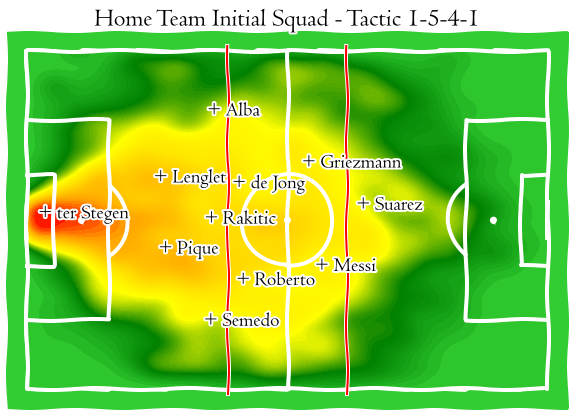

In [30]:
plot_heatmap_team(f_h, 'start')

Calculando posición de los jugadores en el terreno de juego ...

Creando Mapa de calor ...



  0%|          | 0/2 [00:00<?, ?it/s]

Vidal : Midfield Line --> (x:-3.92, y:-7.18)
Fati : Midfield Line --> (x:2.23, y:17.72)

Guardando imagen ...



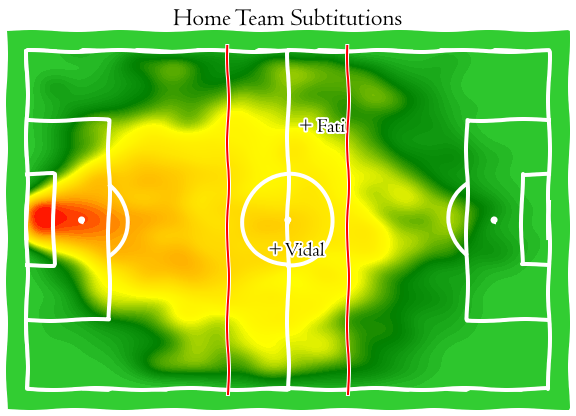

In [31]:
plot_heatmap_team(f_h, 'subs')

Calculando posición de los jugadores en el terreno de juego ...

Creando Mapa de calor ...



  0%|          | 0/11 [00:00<?, ?it/s]

Courtois : Defending Line --> (48.36,-0.37)
Ramos : Defending Line --> (14.9,-7.64)
Varane : Defending Line --> (17.52,4.12)
Mendy : Midfield Line --> (5.71,-20.72)
Carvajal : Midfield Line --> (6.25,17.02)
Casemiro : Midfield Line --> (6.03,0.81)
Kroos : Midfield Line --> (-4.6,-7.75)
Valverde : Midfield Line --> (-10.19,8.4)
Isco : Attacking Line --> (-15.2,-7.78)
Bale : Attacking Line --> (-12.75,15.9)
Benzema : Attacking Line --> (-20.82,-3.86)

Guardando imagen ...



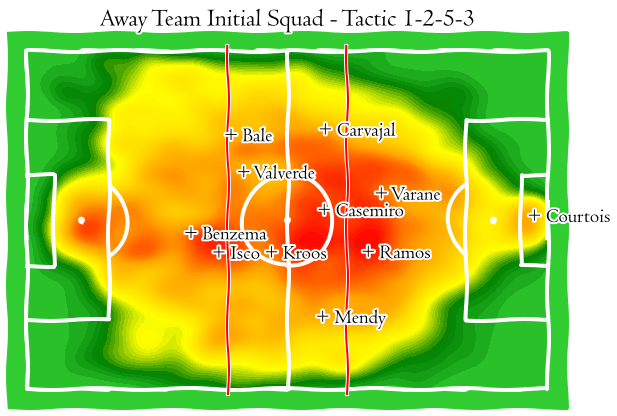

In [32]:
plot_heatmap_team(f_a, 'start')

Calculando posición de los jugadores en el terreno de juego ...

Creando Mapa de calor ...



  0%|          | 0/2 [00:00<?, ?it/s]

Modric : Midfield Line --> (x:-3.42, y:8.84)
Rodrygo : Midfield Line --> (x:-10.29, y:-20.65)

Guardando imagen ...



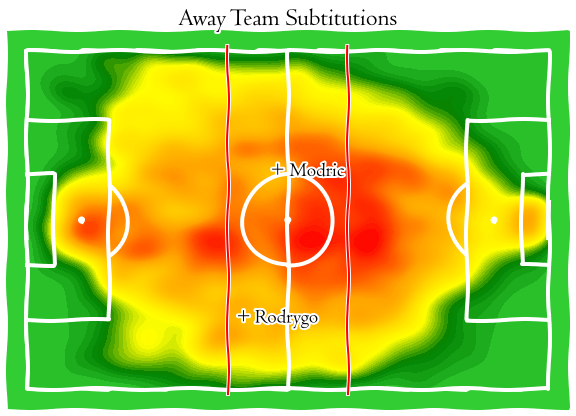

In [33]:
plot_heatmap_team(f_a, 'subs')

In [17]:
def plot_player_heatmap(df:pd.DataFrame)->None:
    
    name = df['last_name'][0]
    x = round(df.pos_x_abs.median(),2)
    y = round(df.pos_y_abs.median(),2)
                
    if df.Home_Away.unique()[0] == 'Away':
                    
        if 12 < x:
            pl_clas = 'Defending Line'
        elif -12 < x < 12:
            pl_clas = 'Midfield Line'   
        else:
            pl_clas = 'Attacking Line'
                
    else:    
        if 12 < x:
            pl_clas = 'Attacking Line'
        elif -12 < x < 12:
            pl_clas = 'Midfield Line' 
        else:
            pl_clas = 'Defending Line'
            
    print('Calculando posiciónes del jugadore en el terreno de juego ...\n')
    print('Creando Mapa de calor ...\n')
    
    with plt.xkcd():
        matplotlib.rcParams['font.family'] = ['CENTAUR']
        pitch = Pitch(pitch_type='skillcorner', pitch_length= 105, pitch_width=68, pitch_color='limegreen', 
                  line_color='white', stripe=False, line_zorder=3)
        fig, ax = pitch.draw(figsize=(12,6))
        
        custcmap = matplotlib.colors.LinearSegmentedColormap.from_list('custom', ['limegreen','green','yellow', 'gold','orange','orangered','red'])
        kde = pitch.kdeplot(df.pos_x_abs, df.pos_y_abs, fill=True, ax=ax,
                       levels=100, shade_lowest=True, cut=4, cmap=custcmap, zorder=1)
        
        plt.title(f'{df.first_name[0]} {name} - {pl_clas}', fontsize=25) 
        plt.annotate(f'+ {name}',(x,y), fontsize=20, zorder=4)
        plt.plot([-12,-12],[-35,35] ,color='r', zorder=3)
        plt.plot([12,12],[-35,35] ,color='r', zorder=3)
        
        
        print(f'{name} : {pl_clas} --> ({x},{y})')
        print('\nGuardando imagen ...\n')
        plt.savefig(f'images/{df.Home_Away[0]}/{name}_heatmap.png')
        
        plt.show();

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Ramos : Defending Line --> (14.9,-7.64)

Guardando imagen ...



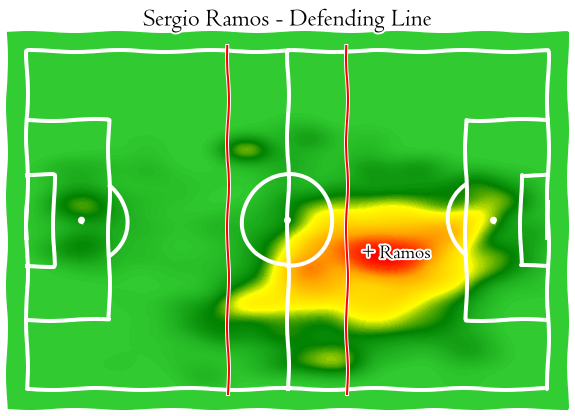

In [18]:
plot_player_heatmap(sr)

In [19]:
start_p_h = [n for n in f_h[f_h.period == 2].sort_values('id_pos').trackable_object.unique() if n in f_h[f_h.period == 1].trackable_object.unique()]
subs_h = [n for n in f_h[f_h.period == 2].sort_values('id_pos').trackable_object.unique() if n not in f_h[f_h.period == 1].trackable_object.unique()]
start_p_a = [n for n in f_a[f_a.period == 2].sort_values('id_pos').trackable_object.unique() if n in f_a[f_a.period == 1].trackable_object.unique()]
subs_a = [n for n in f_a[f_a.period == 2].sort_values('id_pos').trackable_object.unique() if n not in f_a[f_a.period == 1].trackable_object.unique()]

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

ter Stegen : Defending Line --> (-50.17,0.38)

Guardando imagen ...



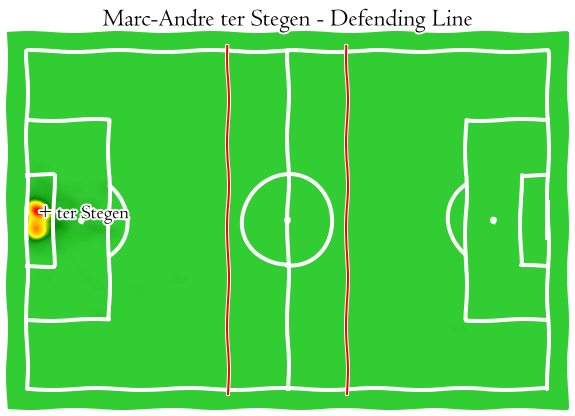

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Lenglet : Defending Line --> (-26.92,7.59)

Guardando imagen ...



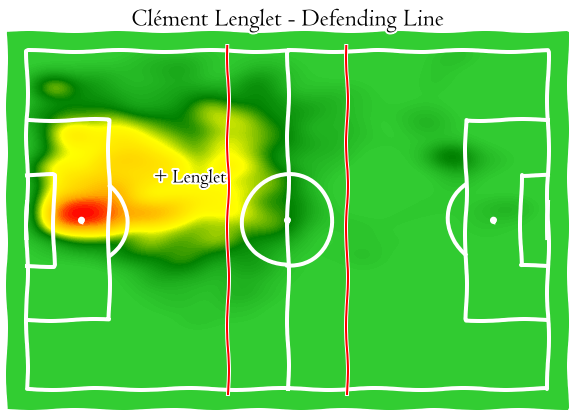

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Pique : Defending Line --> (-25.93,-6.73)

Guardando imagen ...



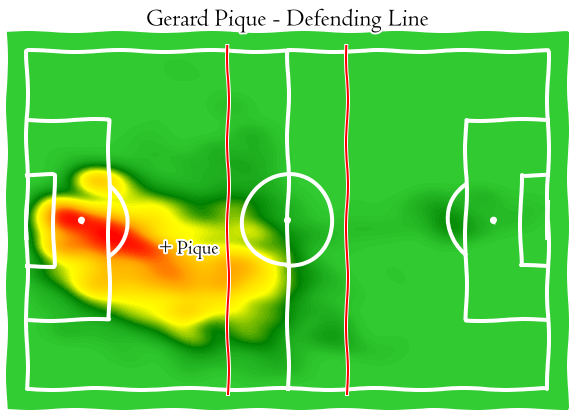

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Alba : Defending Line --> (-16.15,21.08)

Guardando imagen ...



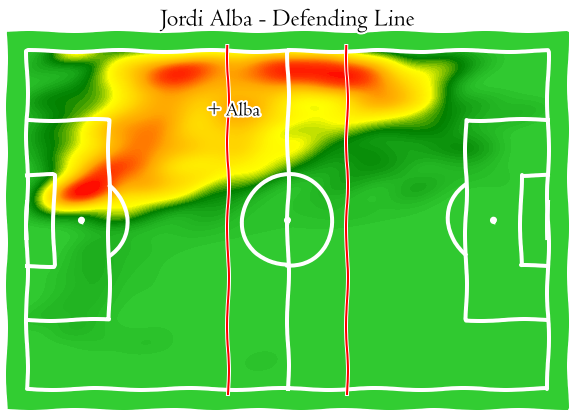

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Semedo : Defending Line --> (-16.83,-21.27)

Guardando imagen ...



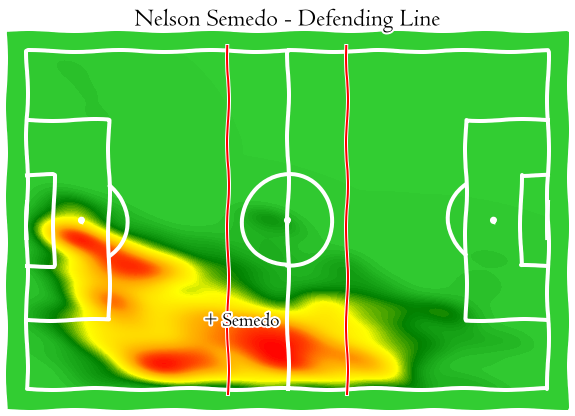

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Rakitic : Defending Line --> (-16.7,-0.71)

Guardando imagen ...



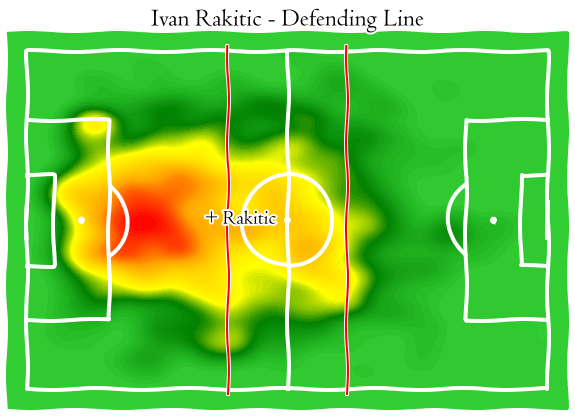

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

de Jong : Midfield Line --> (-11.12,6.44)

Guardando imagen ...



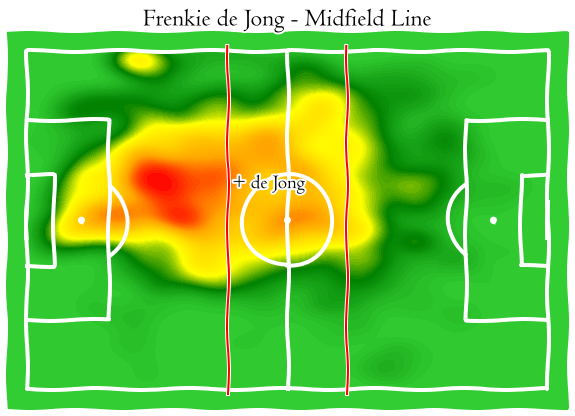

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Roberto : Midfield Line --> (-10.3,-13.08)

Guardando imagen ...



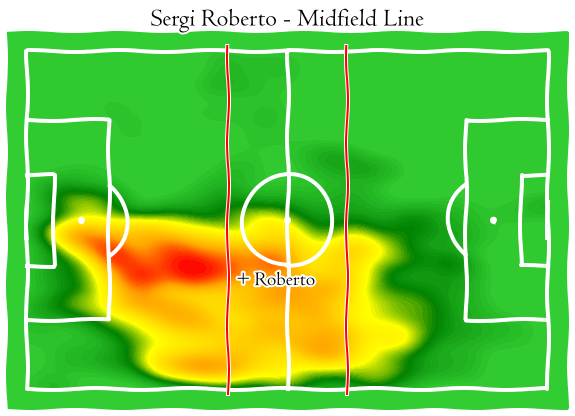

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Griezmann : Midfield Line --> (2.93,10.59)

Guardando imagen ...



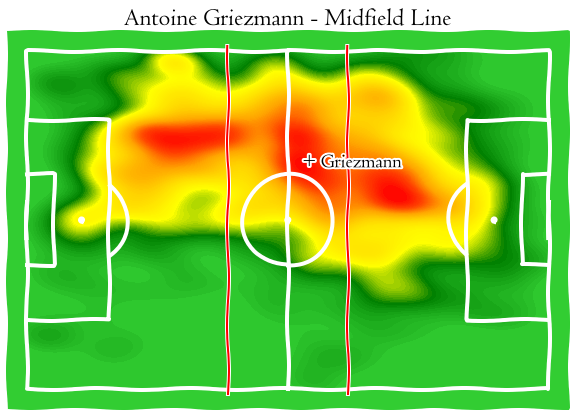

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Messi : Midfield Line --> (5.55,-10.24)

Guardando imagen ...



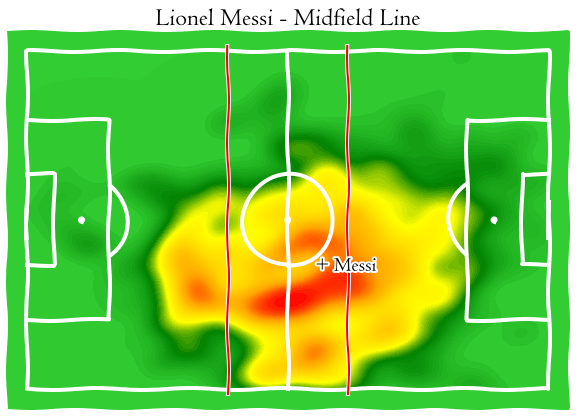

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Suarez : Attacking Line --> (13.88,2.1)

Guardando imagen ...



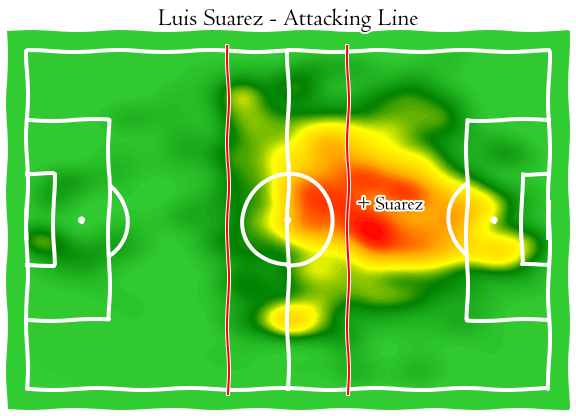

In [20]:
for p in start_p_h:
    pl = generate_player_match_data('data/matches/2841/structured_data.json','data/matches/2841/match_data.json', p)
    plot_player_heatmap(pl)

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Vidal : Midfield Line --> (-3.92,-7.18)

Guardando imagen ...



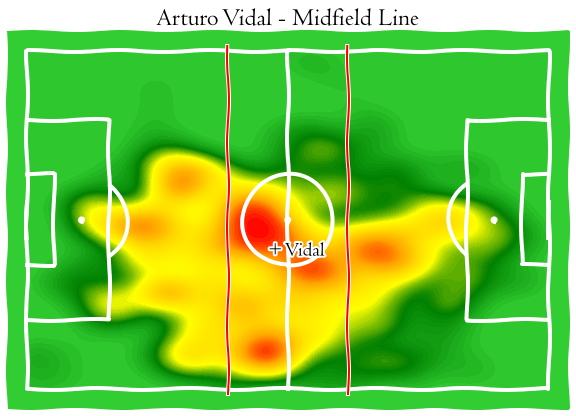

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Fati : Midfield Line --> (2.23,17.72)

Guardando imagen ...



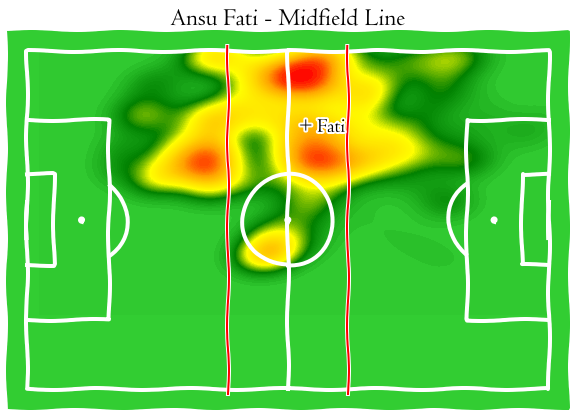

In [21]:
for p in subs_h:
    pl = generate_player_match_data('data/matches/2841/structured_data.json','data/matches/2841/match_data.json', p)
    plot_player_heatmap(pl)

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Courtois : Defending Line --> (48.36,-0.37)

Guardando imagen ...



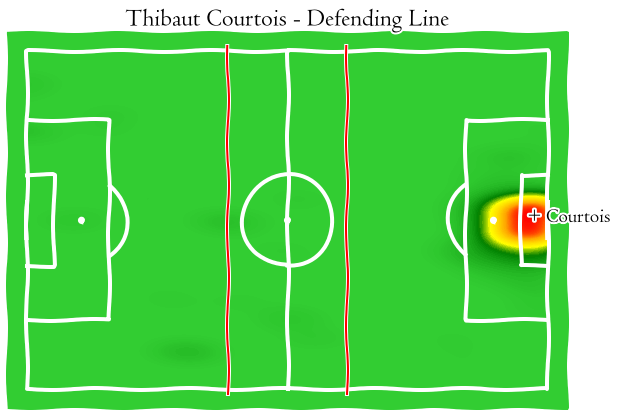

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Ramos : Defending Line --> (14.9,-7.64)

Guardando imagen ...



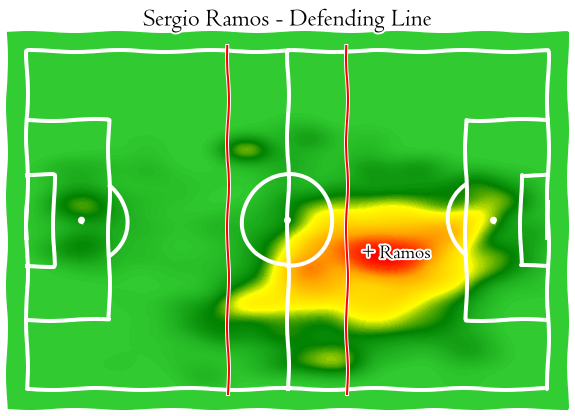

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Varane : Defending Line --> (17.52,4.12)

Guardando imagen ...



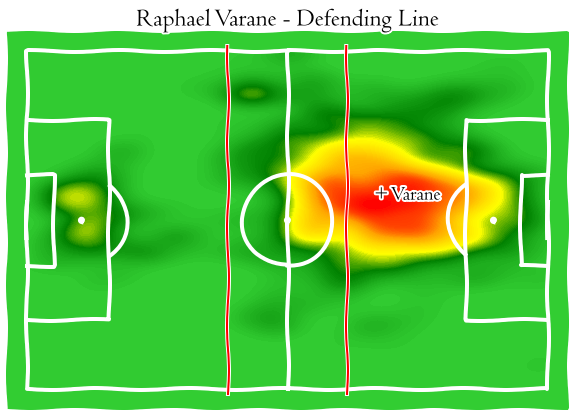

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Mendy : Midfield Line --> (5.71,-20.72)

Guardando imagen ...



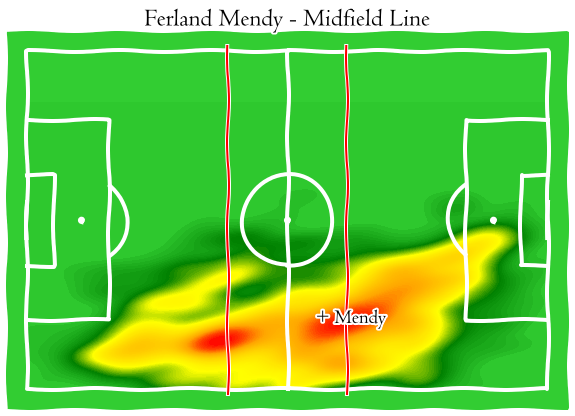

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Carvajal : Midfield Line --> (6.25,17.02)

Guardando imagen ...



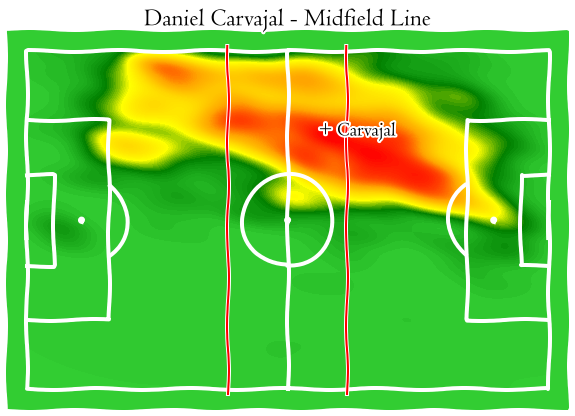

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Casemiro : Midfield Line --> (6.03,0.81)

Guardando imagen ...



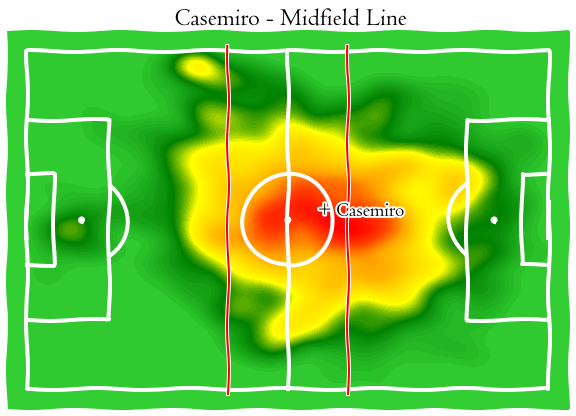

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Kroos : Midfield Line --> (-4.6,-7.75)

Guardando imagen ...



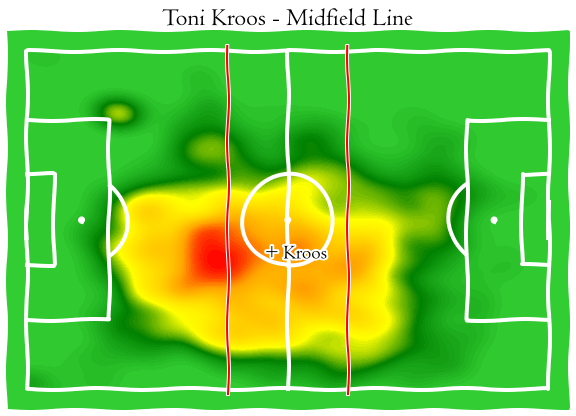

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Valverde : Midfield Line --> (-10.19,8.4)

Guardando imagen ...



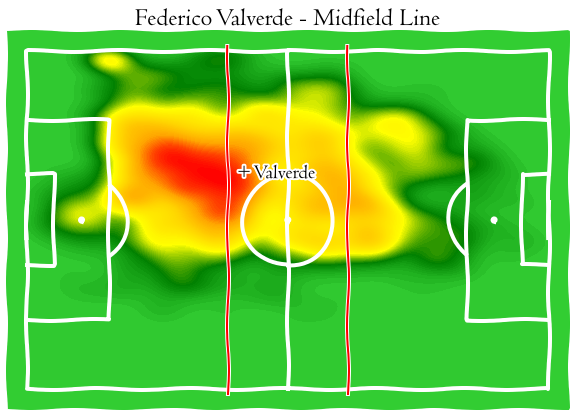

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Isco : Attacking Line --> (-15.2,-7.78)

Guardando imagen ...



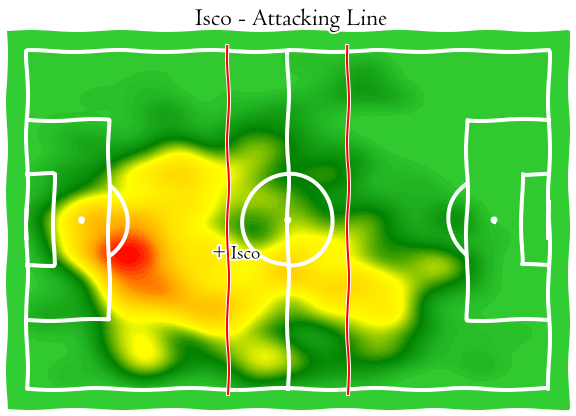

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Bale : Attacking Line --> (-12.75,15.9)

Guardando imagen ...



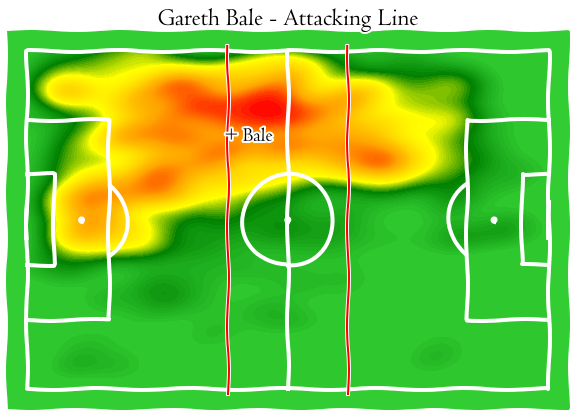

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Benzema : Attacking Line --> (-20.82,-3.86)

Guardando imagen ...



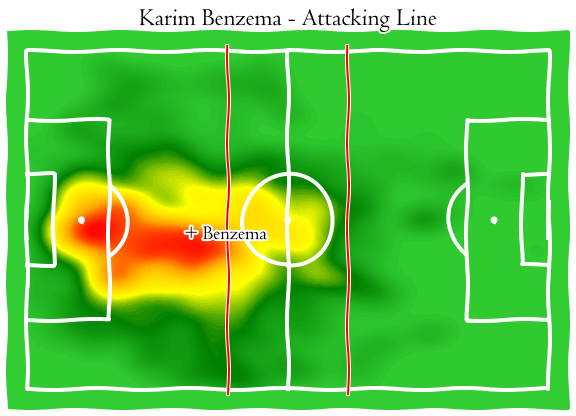

In [22]:
for p in start_p_a:
    pl = generate_player_match_data('data/matches/2841/structured_data.json','data/matches/2841/match_data.json', p)
    plot_player_heatmap(pl)

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Modric : Midfield Line --> (-3.42,8.84)

Guardando imagen ...



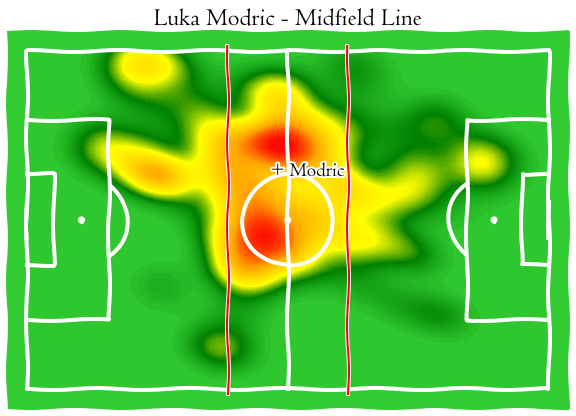

  0%|          | 0/68400 [00:00<?, ?it/s]

Calculando posiciónes del jugadore en el terreno de juego ...

Creando Mapa de calor ...

Rodrygo : Midfield Line --> (-10.29,-20.65)

Guardando imagen ...



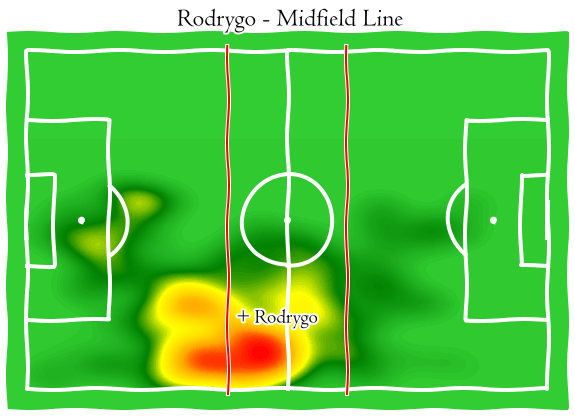

In [23]:
for p in subs_a:
    pl = generate_player_match_data('data/matches/2841/structured_data.json','data/matches/2841/match_data.json', p)
    plot_player_heatmap(pl)

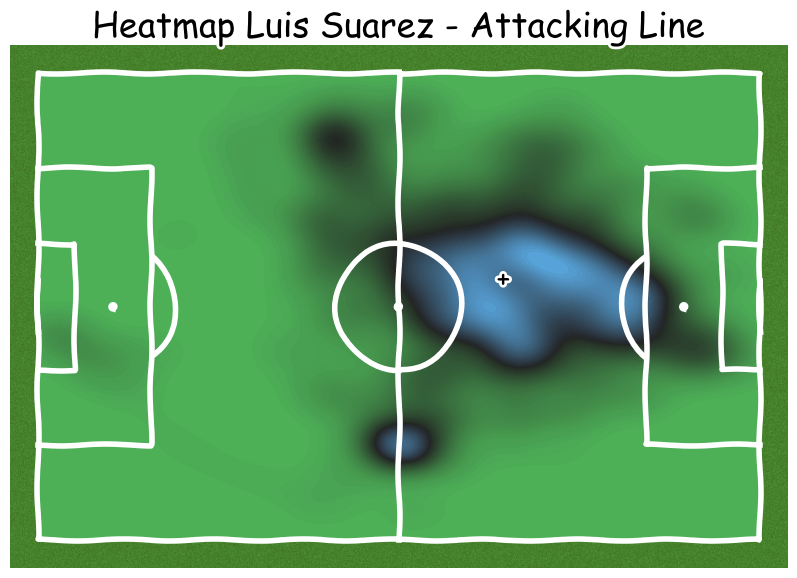

In [70]:
plot_heatmap_pos(match_js, players, 6460)

In [67]:
home = players[players.Home_Away == 'Home'].sort_values('id_pos')

home

,id,trackable_object,first_name,last_name,team_id,Position,id_pos,Home_Away
0,6679,6689,Marc-Andre,ter Stegen,264,Goalkeeper,0,Home
1,11623,11712,Clément,Lenglet,264,Left Center Back,3,Home
27,3852,3862,Gerard,Pique,264,Right Center Back,4,Home
2,5326,5336,Jordi,Alba,264,Left Wing Back,5,Home
31,1091,1101,Arturo,Vidal,264,Right Wing Back,6,Home
15,11454,11514,Nelson,Semedo,264,Right Wing Back,6,Home
5,4550,4560,Ivan,Rakitic,264,Center Midfield,8,Home
3,12378,12524,Frenkie,de Jong,264,Left Midfield,9,Home
4,9735,9745,Sergi,Roberto,264,Right Midfield,10,Home
34,23843,24800,Ansu,Fati,264,Left Winger,12,Home


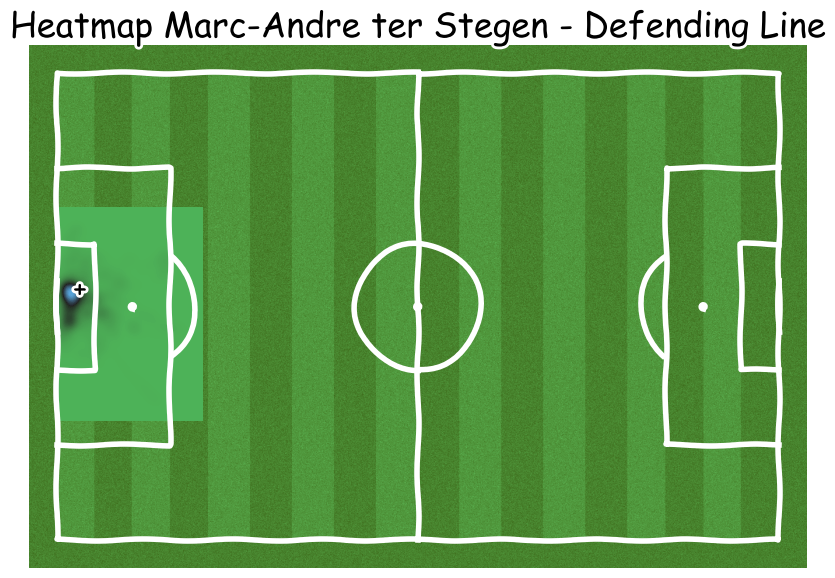

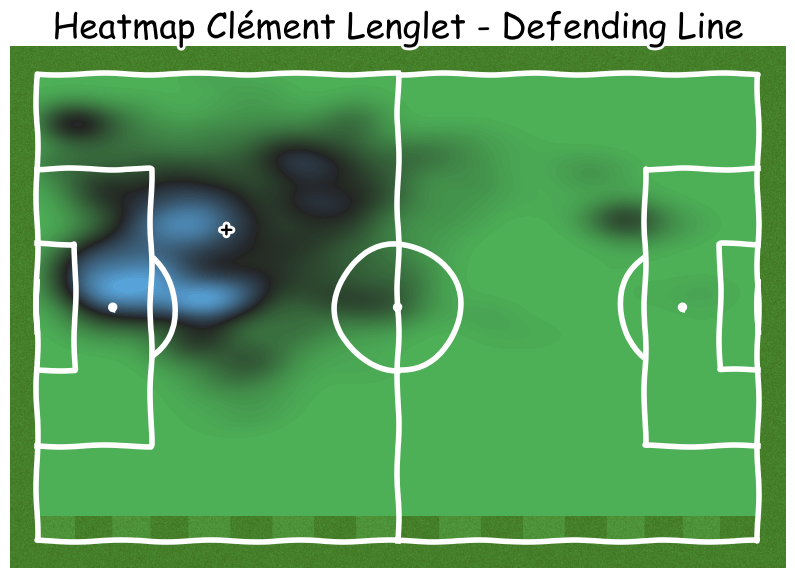

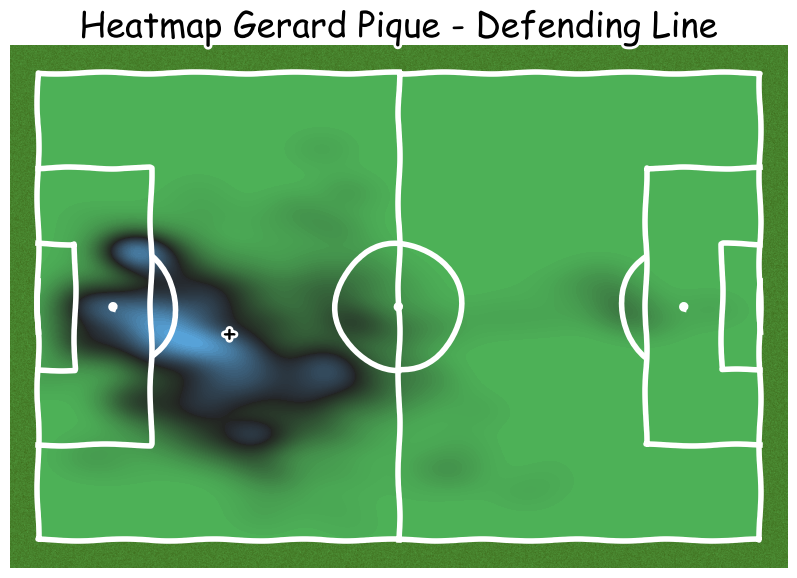

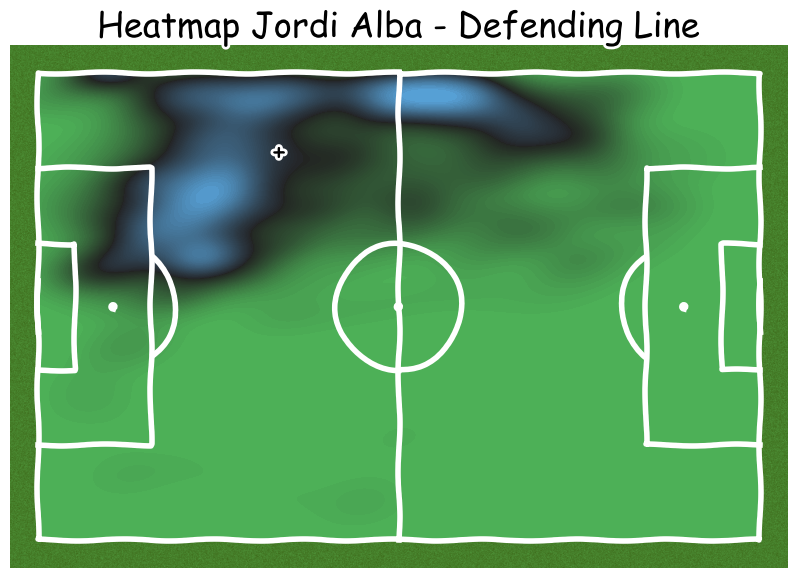

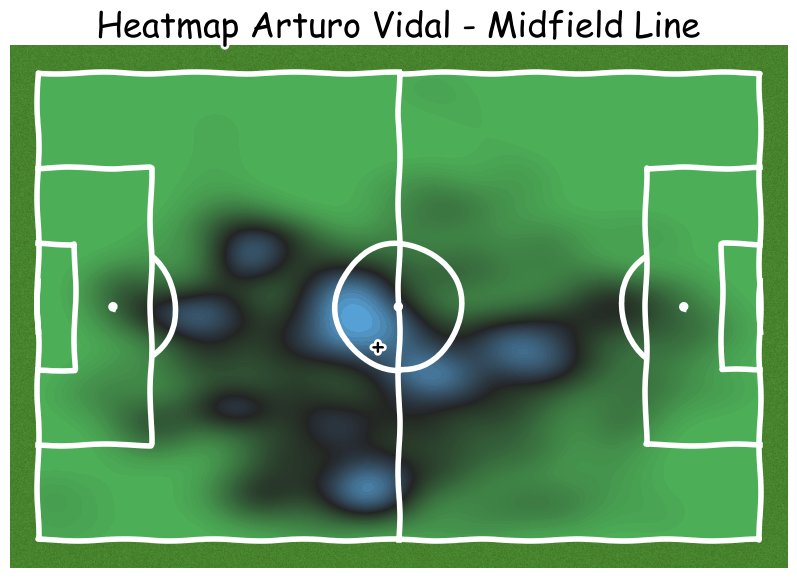

...

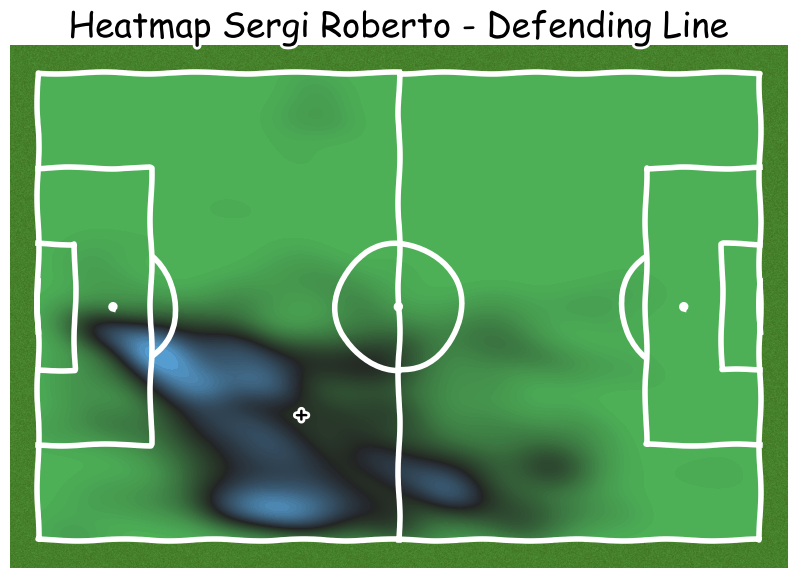

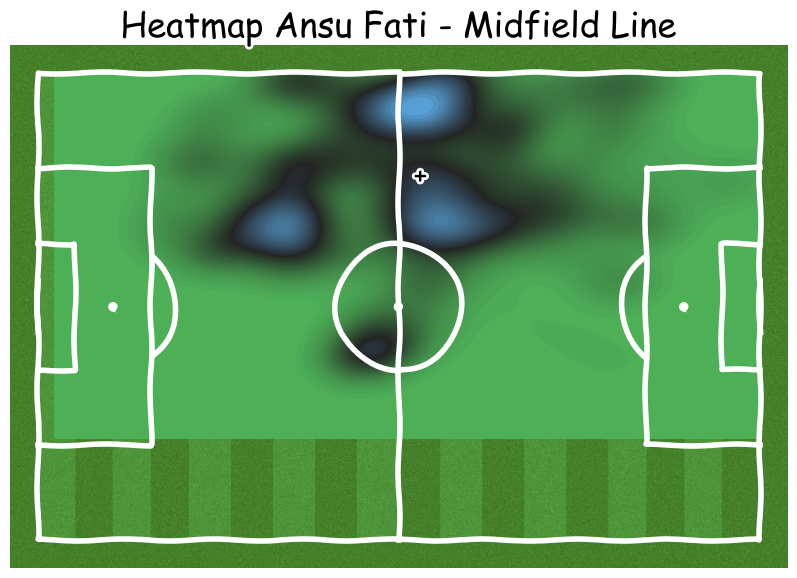

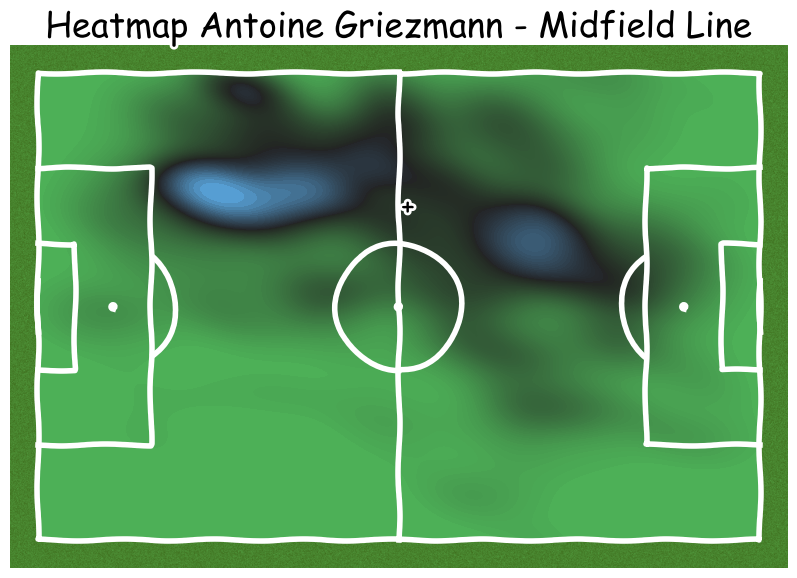

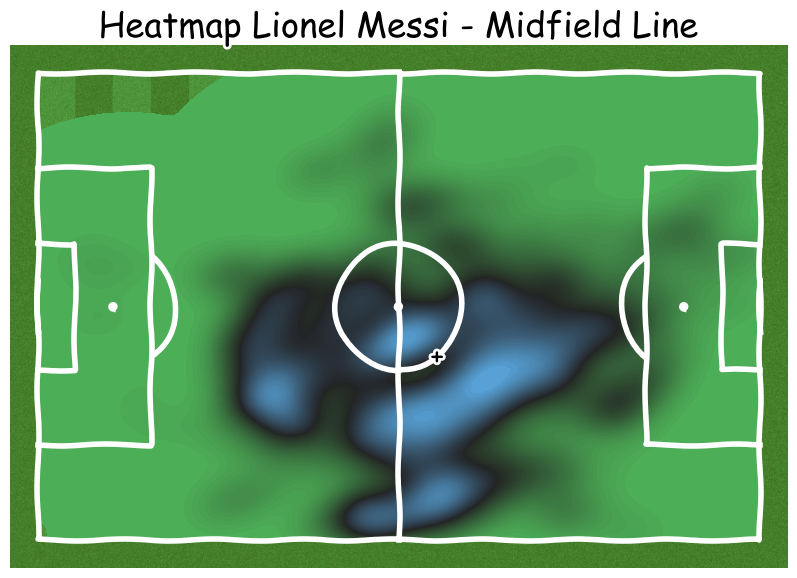

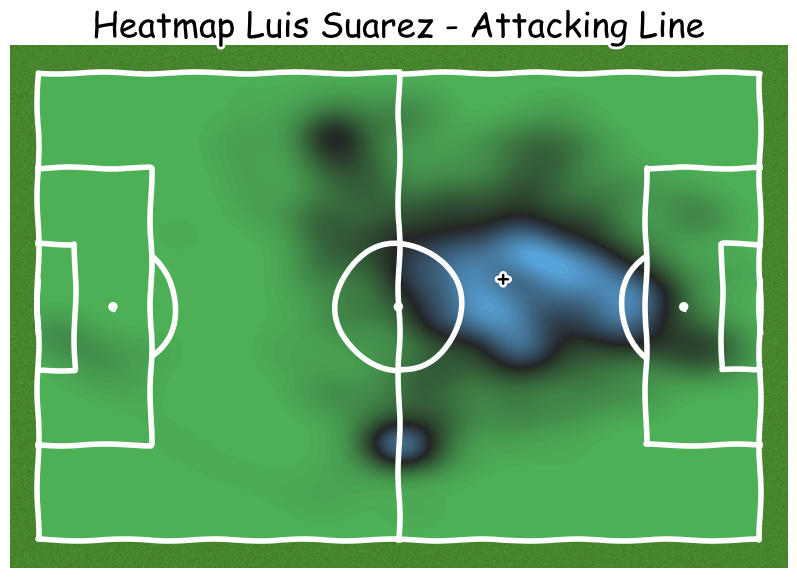

No hay datos de Sergio Busquets
No hay datos de Carles Alena
No hay datos de Samuel Umtiti
No hay datos de  Neto
No hay datos de Carles Perez


In [68]:
for ot in [i for i in home.trackable_object]:
    plot_heatmap_pos(match_js, players, ot)

In [65]:
away = players[players.Home_Away == 'Away'].sort_values('id_pos')

away

,id,trackable_object,first_name,last_name,team_id,Position,id_pos,Home_Away
10,10261,10271,Thibaut,Courtois,262,Goalkeeper,0,Away
12,9765,9775,Sergio,Ramos,262,Left Center Back,3,Away
11,8876,8886,Raphael,Varane,262,Right Center Back,4,Away
30,11277,11311,Ferland,Mendy,262,Left Wing Back,5,Away
29,2189,2199,Daniel,Carvajal,262,Right Wing Back,6,Away
17,1674,1684,,Casemiro,262,Center Midfield,8,Away
25,10520,10530,Toni,Kroos,262,Left Midfield,9,Away
28,12251,12395,Federico,Valverde,262,Right Midfield,10,Away
32,6462,6472,Luka,Modric,262,Right Midfield,10,Away
33,23903,24861,,Rodrygo,262,Left Winger,12,Away


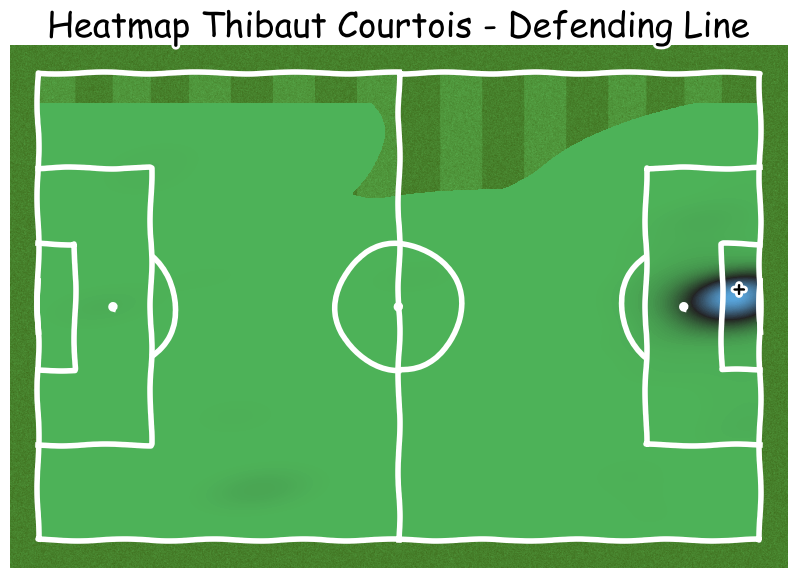

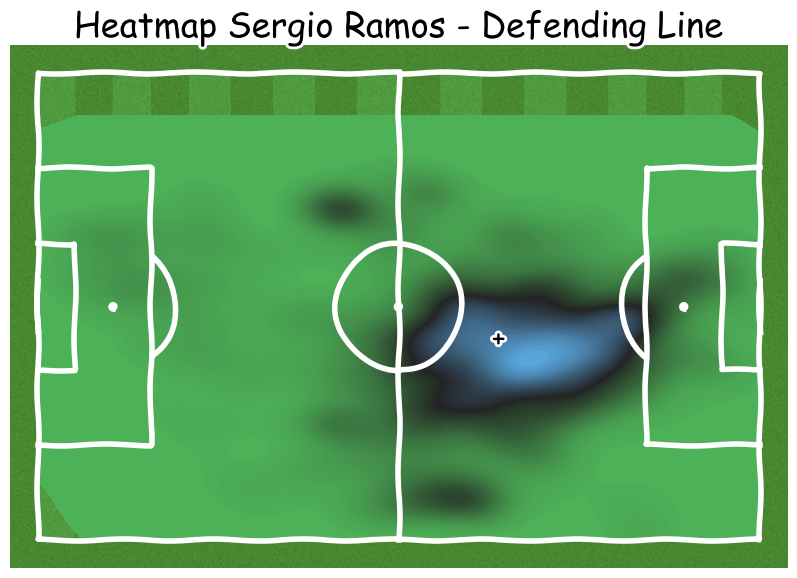

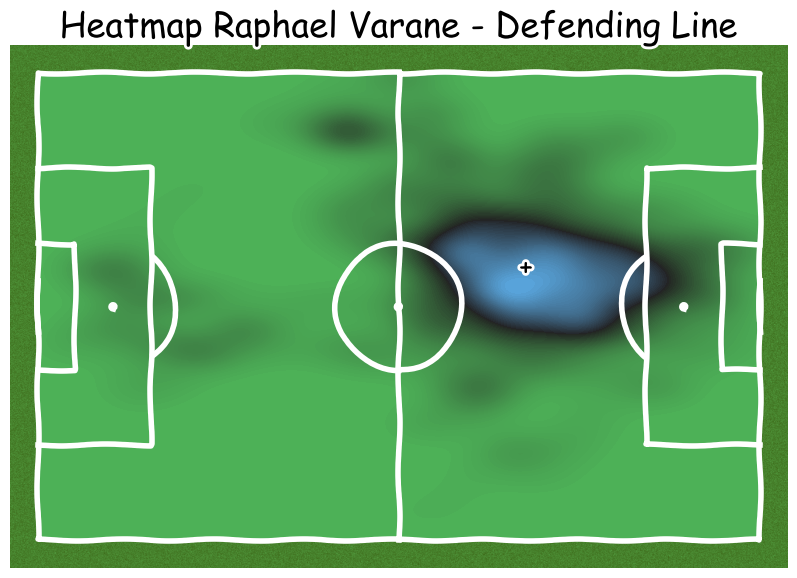

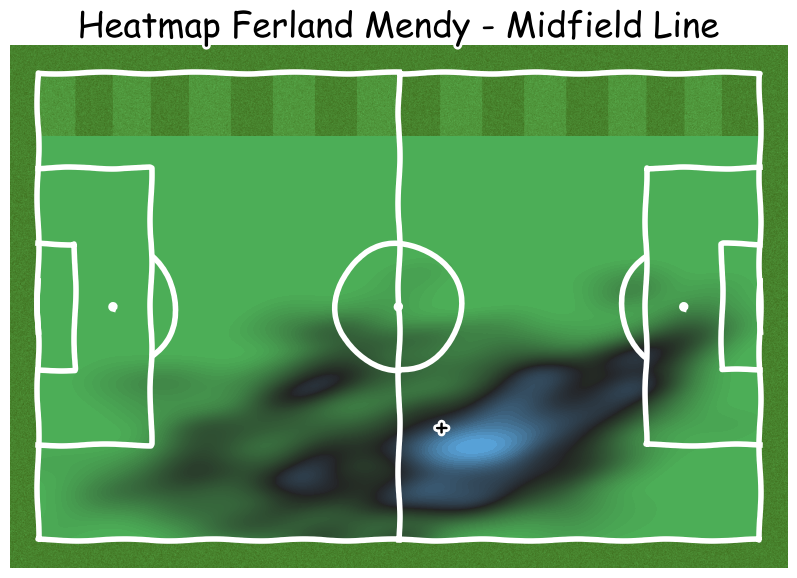

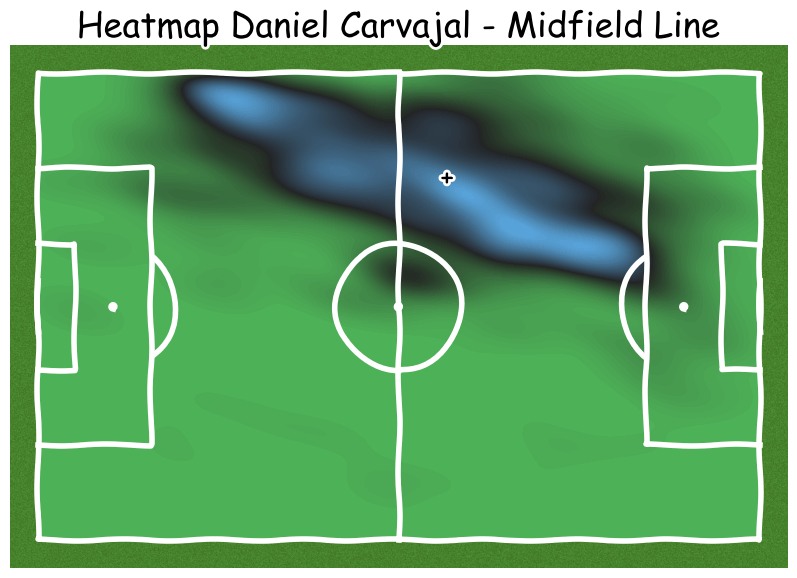

...

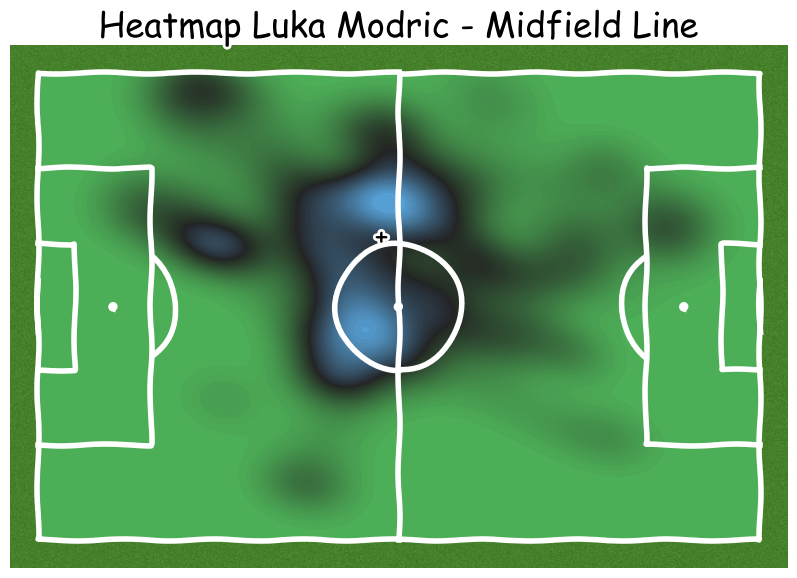

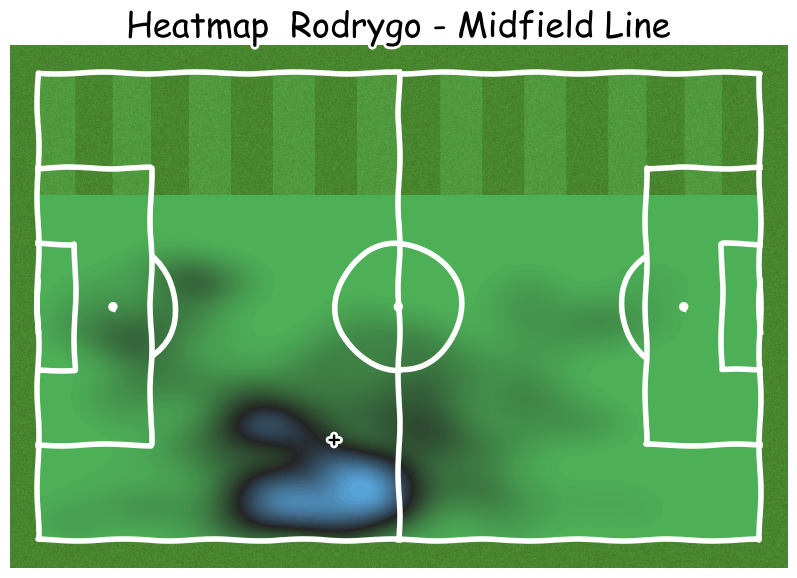

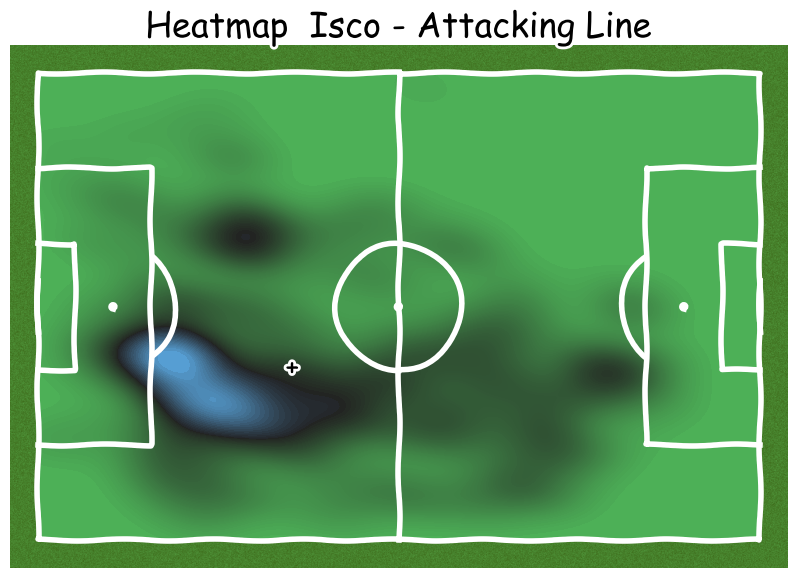

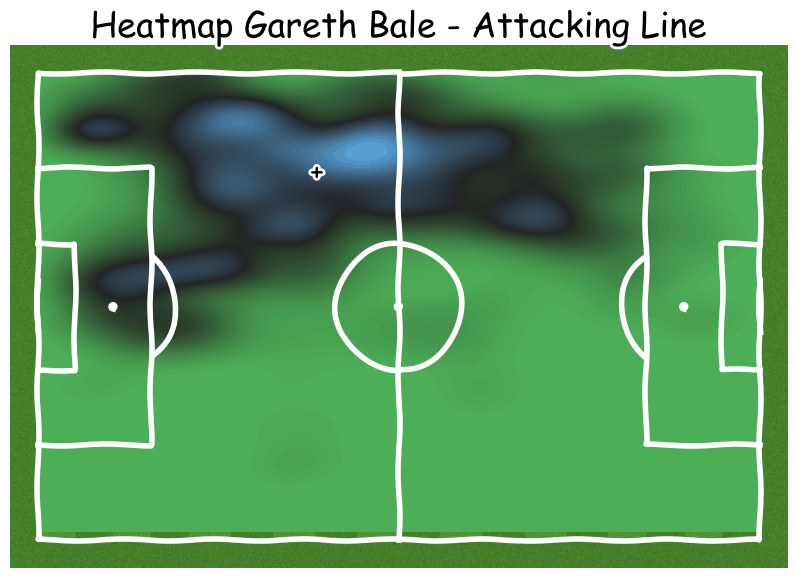

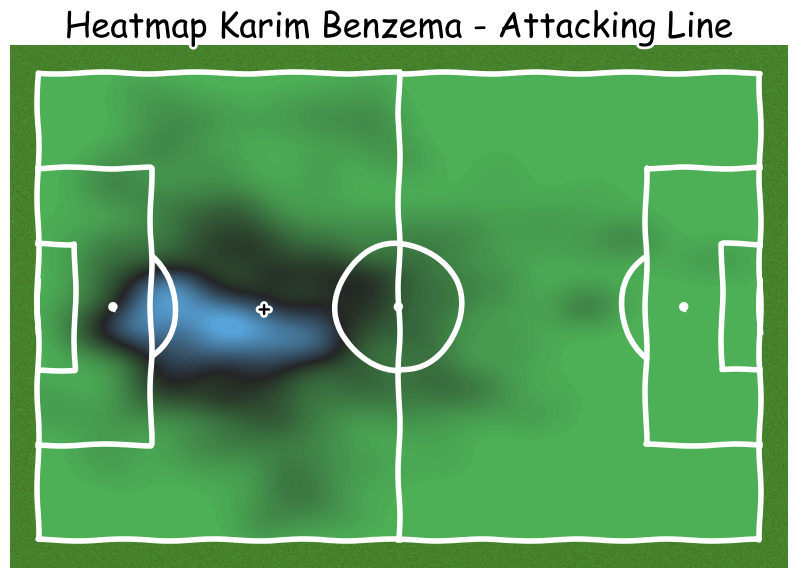

No hay datos de Alphonse Areola
No hay datos de  Nacho
No hay datos de Junior Vinicius
No hay datos de Luka Jovic
No hay datos de Eder Militao


In [66]:
for ot in [i for i in away.trackable_object]:
    plot_heatmap_pos(match_js, players, ot)